# Question
* Combien de contentieux climatiques (politiques climatique ou les GES) ont été lancés depuis l'Affaire du Siècle (2020) ?
* Différenciel avec le nombre de contentieux lancés avant 2020 (sachant que le 1er contentieux climatique date de 2007) ?
* affaires dans lesquelles le défendeurs est un Etat ou une autorité publique (exclue les contentieux contre des entreprises)
* où les demandes ne concernent pas la politiques climatique ou les GES

In [110]:
from naat_core.data_files import GLOBAL_LITIGATION_CASES_PATH
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [4]:
global_cases_df = pd.read_csv(GLOBAL_LITIGATION_CASES_PATH)
global_cases_df.head()

,Case Name,ID,Permalink,Summary,Case Categories,Jurisdictions,Principal Laws,Status,Reporter Info,Filing Year for Action,Core Object
0,Aldous v. Greater Taree City Council and Another,2204,https://climatecasechart.com/non-us-case/aldou...,An Australian court upheld approval of a devel...,Suits against governments>Environmental assess...,Australia>New South Wales>Land and Environment...,Australia,NaN,Land and Environment Court of New South Wales ...,2009.0,NaN
1,Ground Crew at Turramurra v. Ku-ring-gai Council,2504,https://climatecasechart.com/non-us-case/groun...,Applicant appealed the denial of a permit for ...,Suits against governments>Environmental assess...,Australia>New South Wales>Land and Environment...,Australia>Environmental Planning and Assessmen...,Appeal dismissed,[2008] NSWLEC 86 (Australia),2008.0,Appeal of denial of a planning permit due to r...
2,Haughton v. Minister for Department of Plannin...,2505,https://climatecasechart.com/non-us-case/haugh...,Ned Haughton challenged the approval granted b...,Suits against governments>Environmental assess...,Australia>New South Wales>Land and Environment...,Australia>Precautionary Principle|Australia>Pr...,Application dismissed,[2011] NSWLEC 217 (Australia),2011.0,Challenge to government approval of two coal-f...
3,Able Lott Holdings Pty. Ltd. v. City of Fremantle,2508,https://climatecasechart.com/non-us-case/able-...,This case concerned a development application ...,Suits against governments>Environmental assess...,Australia>Western Australia>State Administrati...,Australia>State Coastal Planning Policy (Weste...,Application dismissed,[2010] WASAT 117 (Australia),2010.0,Challenge to approve development of site despi...
4,Aldous v. Greater Taree City Council and Another,2510,https://climatecasechart.com/non-us-case/aldou...,An Australian court upheld approval of a deve...,NaN,Australia>New South Wales>Land and Environment...,Australia,Application dismissed,[ 2009 ] NCWELC 17 (Australia),2009.0,Challenge to city council decision granting de...


# Data Proprocessing

In [68]:
global_cases_df["Jurisdictions"] = global_cases_df["Jurisdictions"].str.replace("&amp;", "&")

## Filtering on Not null `Filing Year` and `Case Categories for Action`

In [76]:
df = global_cases_df[global_cases_df["Filing Year for Action"].notna()]
df = df[df["Case Categories"].notna()]

df = df.astype({'Filing Year for Action':'int', 'Case Categories':'str'})

# Group by Case categories

In [78]:
def category_column_mapper(column_name):
    if isinstance(column_name, str):
        return column_name
    
    return f"Category {column_name+1}th"

df = df.merge(
    df["Case Categories"].str.split(
        "|",
        expand=True
    ).apply(
        lambda x: x.str.split(">")
    ),
    left_index=True, right_index=True
    ).rename(category_column_mapper, axis="columns"
)

In [79]:
df["Main Category"] = df.loc[:, "Category 1th"].apply(lambda x: x[0])

In [119]:
main_category_by_year = df.groupby(by=["Main Category", "Filing Year for Action"])["Case Name"].count().reset_index().rename(columns={"Case Name": "Count"})
main_category_by_year = main_category_by_year.pivot(index="Filing Year for Action", columns="Main Category", values='Count').fillna(0)
main_category_by_year = main_category_by_year.rename(columns={
    "Suits against corporations, individuals": "Suits against\ncorporations,\nindividuals",
    "Suits against governments": "Suits against\ngovernments"}
)


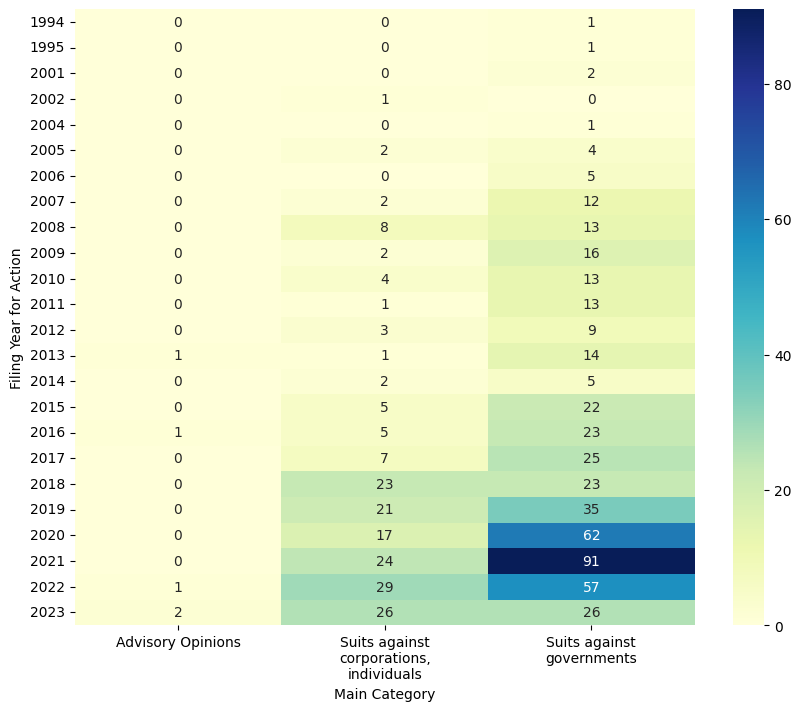

In [129]:
plt.figure(figsize=(10,8))
sns.heatmap(main_category_by_year, cmap="YlGnBu", annot=True)

plt.xticks(rotation=0)
plt.show()

# Filtering on Case Categories

In [50]:
df = df[df["Case Categories"].notna()]
df = df[df["Case Categories"].str.contains("Suits against governments")]

# Grouping

<Axes: ylabel='Filing Year for Action'>

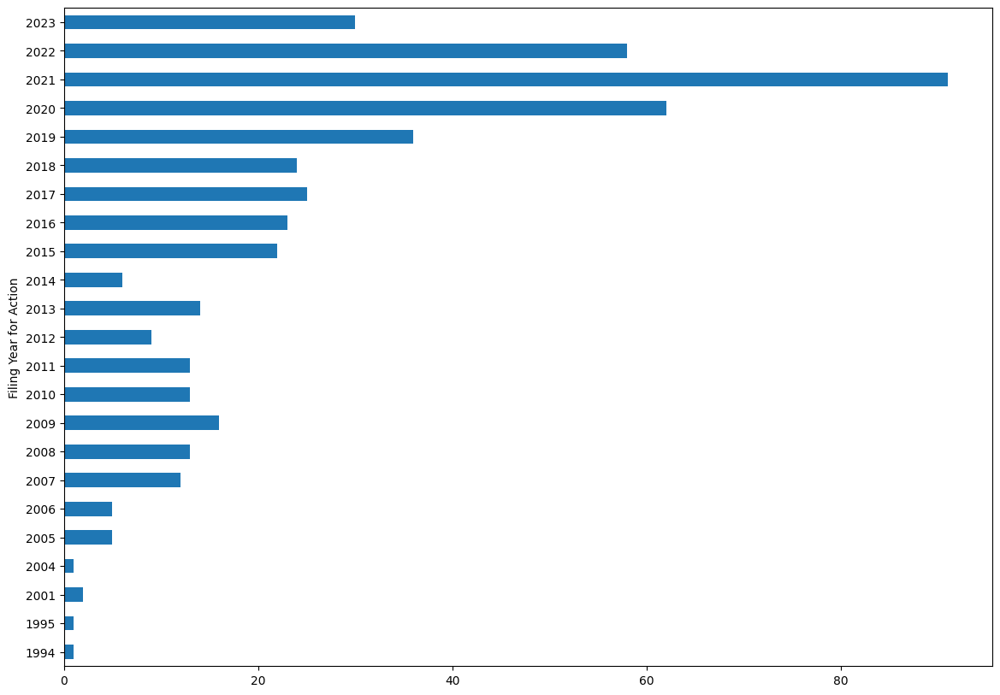

In [51]:
df.groupby(by="Filing Year for Action")["ID"].count().plot(figsize=(14, 10), kind="barh")

In [59]:
total = len(df)
before_2020 = sum(df["Filing Year for Action"] < 2020)
after_2020 = sum(df["Filing Year for Action"] >= 2020)

print("Nombre total de contentieux ayant une date non nulle", total)
print("Nombre de contentieux avant 2020 exclu", before_2020)
print("Nombre de contentieux après 2020 inclu", after_2020)

Nombre total de contentieux ayant une date non nulle 482
Nombre de contentieux avant 2020 exclu 241
Nombre de contentieux après 2020 inclu 241


In [55]:
print(df.reset_index(drop=True).to_markdown())

|     | Case Name                                                                                                                                                                                                                         |    ID | Permalink                                                                                                                                                                                                                                         | Summary                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                         

In [ ]:
print(df[df["Case Categories"].str.contains("Suits against corporations")].to_markdown())